# PyGMT: Different colormaps for land and water


With Python and PyGMT it is quite easy to draw a simple map with elevation of mountains and bathymetry of oceans. However, the simplest approach relies on a colormap colouring everything below 0 m mean sea level in shades of blue, everything above 0 m in shades of green/brown (e.g. with cmap=”geo”). With a world map or in the mountains the result looks pretty good, but with coastlines on detailed maps there are problems. A map of Holland clearly shows the problem:

In [30]:
import pygmt

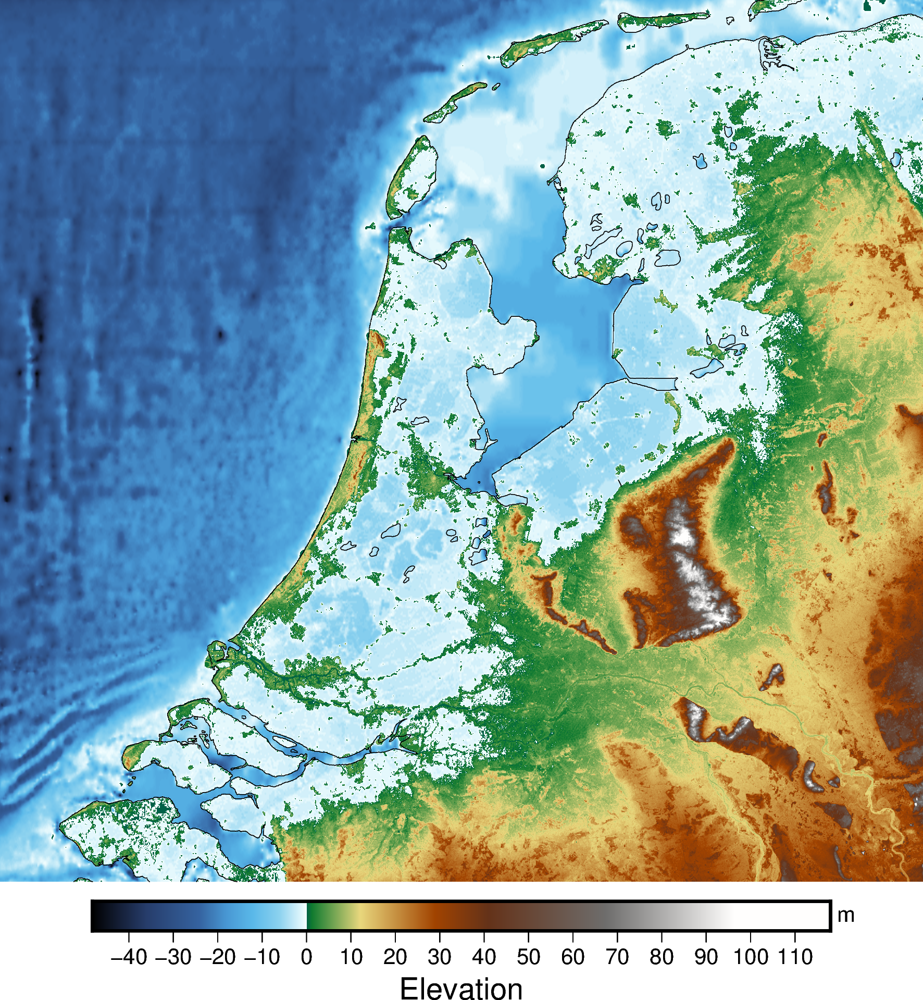

In [31]:
region=[3.2, 6.8, 51.4, 53.5]
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=region)
fig = pygmt.Figure()
fig.grdimage(grid=grid, projection="M15c", cmap="geo")
fig.colorbar(frame=["a10", "x+lElevation", "y+lm"])
fig.coast(shorelines=True, region=region, resolution="f")
fig.show()

The solution is to use a mask for dry and wet areas. We can generate one, corresponding to the coastline in fig.coast():

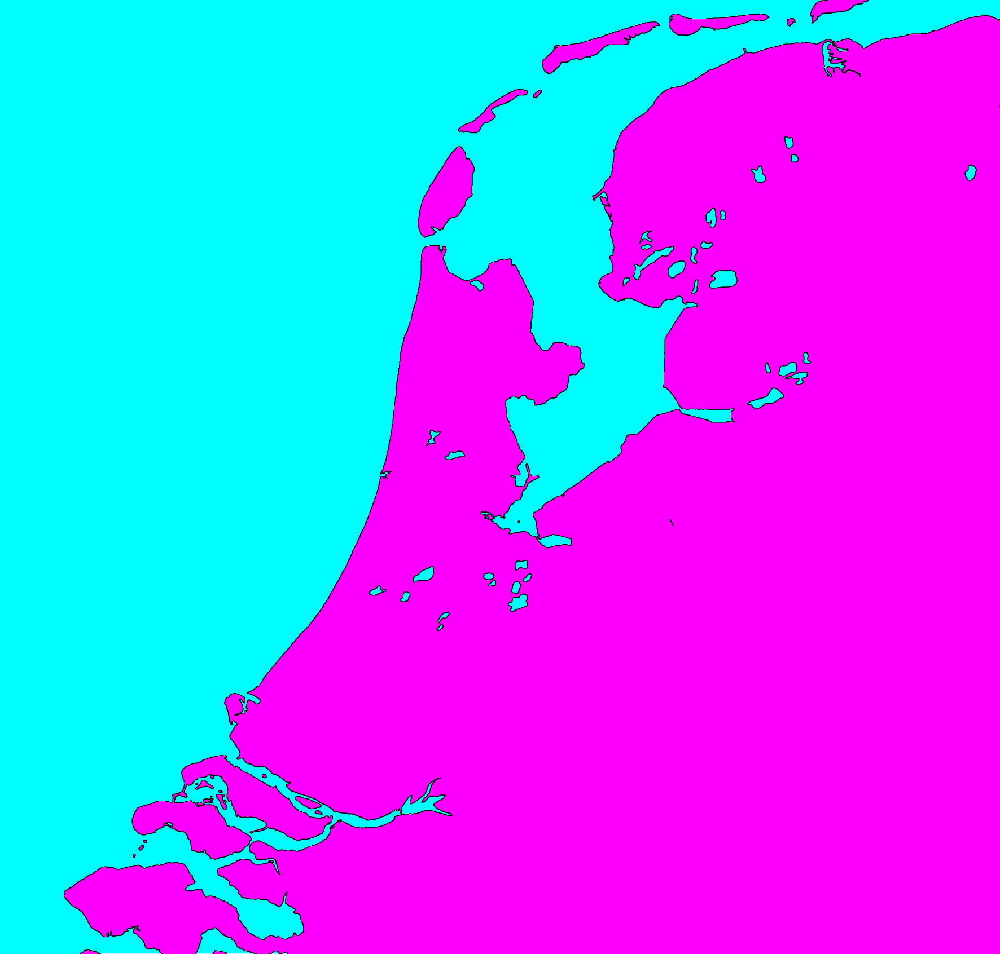

In [16]:
mask = pygmt.grdlandmask(region=region, spacing="03s", maskvalues=[0, 1], resolution="f")

fig = pygmt.Figure()
fig.grdimage(grid=mask, projection="M15c", cmap="cool", shading=True)
fig.coast(shorelines=True,region=region, resolution="f")

fig.show()

With pygmt 0.9 and later, it is possible to download a mask grid for some resolutions with pygmt.datasets.load_earth_mask instead of calculating it with pygmt.grdlandmask.

The first trick is that this mask can simply be multiplied by the grid, then all water pixels are set to 0. Now we can draw the land with a suitable colormap, e.g. cmap=”dem1″. As “spacing” for the mask I use the value of the “resolution” of the dataset and “resolution” of the mask is “f”, i.e. full resolution as in fig.coast().

We plot the water over the result in the second step. However, we cannot simply use “maskvalues=[1, 0]” now, because then the land becomes shallow water of 0 m depth. Fortunately, it is possible to specify “NaN” (as a string) as a value in the mask. And in fig.grdimage we can ensure with “nan_transparent=True” that the land is now transparent.

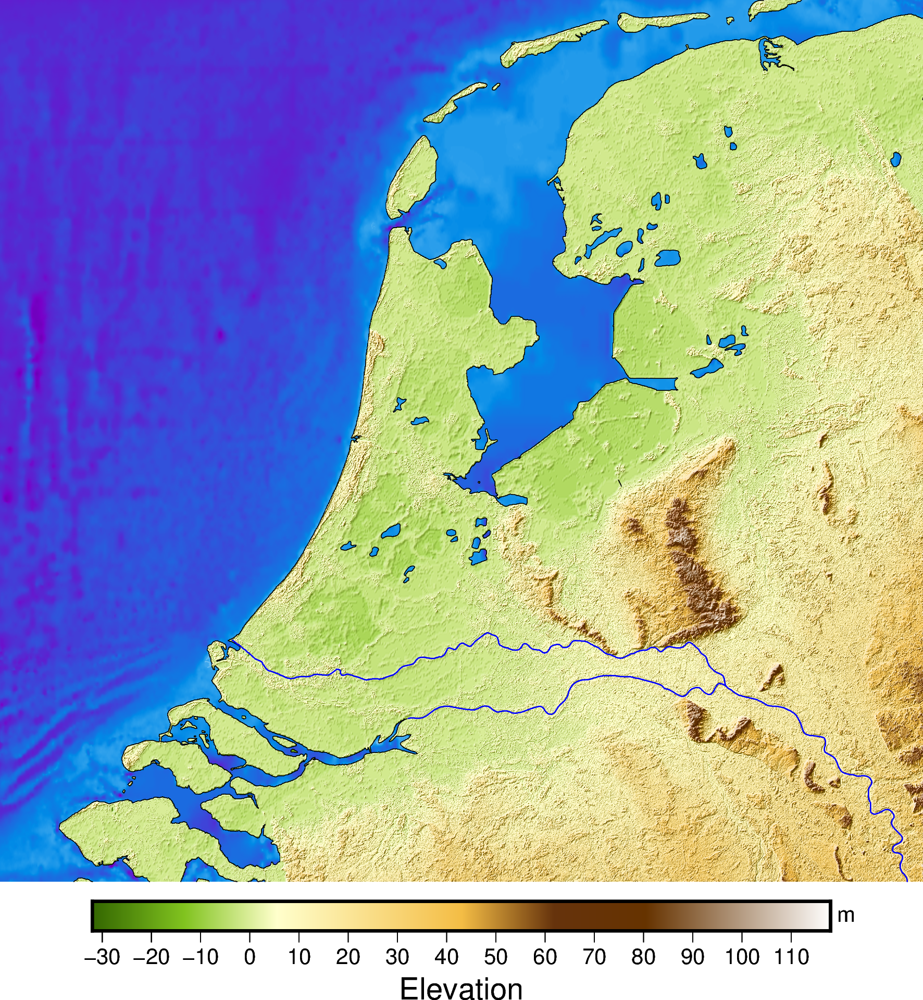

In [32]:
land = grid * pygmt.grdlandmask(region=region, spacing="03s", maskvalues=[0, 1], resolution="f")
wet = grid * pygmt.grdlandmask(region=region, spacing="03s", maskvalues=[1, "NaN"], resolution="f")

fig = pygmt.Figure()
fig.grdimage(grid=land, projection="M15c", cmap="dem1", shading=True)
fig.colorbar(frame=["a10", "x+lElevation", "y+lm"])
fig.grdimage(grid=wet, cmap="seafloor", nan_transparent=True)

fig.coast(shorelines=True, projection="M15c",region=region, resolution="f")
fig.coast(rivers="1/0.5p,blue")

fig.show()

In [33]:
# fig.savefig("holland2.png")